In [4]:
import numpy as np
import pandas as pd
import pickle as pl
import pylab as pyl
import scipy as sp

from ptsa.data.filters import ButterworthFilter
from ptsa.data.filters import MorletWaveletFilter
from ptsa.data.filters import ResampleFilter
from ptsa.data.timeseries import TimeSeries

from cmlreaders import CMLReader

from pycircstat import mean as circmean

from scipy.io import loadmat
import mne
from mne.viz import plot_alignment, snapshot_brain_montage
from mne import create_info, EpochsArray
from mne.baseline import rescale
from mne.time_frequency import (tfr_multitaper, tfr_stockwell, tfr_morlet,
                                tfr_array_morlet)
from mne.viz import centers_to_edges
from scipy import signal
from scipy.signal import argrelextrema

from pandas import DataFrame

from ipywidgets import IntProgress

from mpl_toolkits.axes_grid1 import make_axes_locatable

from PIL import Image

from numpy import unravel_index

import os

import mat73

import glob

from tarjan import tarjan

import bisect

from sklearn.metrics.pairwise import euclidean_distances

from memory_profiler import profile

from sklearn.preprocessing import QuantileTransformer, quantile_transform

import tabulate
import time

from pactools import Comodulogram, REFERENCES
from pactools import simulate_pac

import matplotlib.colors as colors
import matplotlib.cm as cmx
import nilearn.plotting as ni_plot
from matplotlib import pyplot as plt
import matplotlib.font_manager
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.colors as clrs
import matplotlib as mpl
from matplotlib import ticker
import sys
sys.path.append('/home1/anup.das/Traveling_Waves_Codes/SubjectLevel')
import RAM_helpers_New
import par_funcs
from scipy.optimize import curve_fit
from scipy.stats import ttest_ind
from scipy.stats import pearsonr
from scipy.stats import circmean
import pycircstat
from scipy.signal import argrelmax, hilbert
from scipy.signal import decimate
from scipy.signal import resample
from scipy.signal import resample_poly
from scipy.spatial.distance import pdist, squareform
from scipy.signal import butter, sosfiltfilt
from sklearn.decomposition import PCA
from tqdm import tqdm
from joblib import Parallel, delayed
import warnings; warnings.simplefilter('ignore')
import pickle
import joblib
import statsmodels

import statsmodels.api as sm
from scipy import stats
import scipy as sp

import warnings
from cmlreaders.warnings import MultiplePathsFoundWarning
from cmlreaders.warnings import MissingCoordinatesWarning
warnings.filterwarnings(action = 'ignore', category = MultiplePathsFoundWarning)
warnings.filterwarnings(action = 'ignore', category = MissingCoordinatesWarning)

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

In [2]:
#load average referenced insula data for all subjects
insula_data_all = mat73.loadmat('CAR_insula_All.mat')

In [5]:
#Calculate power for all subjects
N_Minutes = 5
sfreq = 2000.0
N_Samples = int(N_Minutes*60*sfreq)
freqs = np.logspace(np.log10(3), np.log10(40), 200)

for i_subj in range(0, len(insula_data_all.CAR_insula.data), 1):
    
    Data = insula_data_all.CAR_insula.data[i_subj][:, 0:N_Samples]
    Coord = insula_data_all.CAR_insula.coordinates[i_subj]
    
    ch_names = []
    for i in range(0, np.shape(Coord)[0], 1):
        ch_names.append(str(i))

    ch_types = []
    for i in range(0, np.shape(Coord)[0], 1):
        ch_types.append('seeg')

    info = create_info(ch_names=ch_names, sfreq=sfreq, ch_types=ch_types)

    n_epochs = 1
    data_temp = Data
    data = np.empty(((n_epochs, np.shape(data_temp)[0], np.shape(data_temp)[1])))
    data[0, :, :] = data_temp

    epochs = EpochsArray(data = data, info = info, events = None, event_id = None,
                         reject = None)
    
    power = tfr_morlet(epochs, freqs = freqs, n_cycles = 5, return_itc=False)
    
    power_log = np.log10(power._data)
    power_log_mean = np.mean(power_log, axis = 2)
    with open('/home1/anup.das/Results/baylor_files/power/power5min_log_mean_subj_' + str(i_subj) + '.pkl', 'wb') as f:
            pickle.dump(power_log_mean, f)

In [5]:
#Run clustering algorithm for all subjects
for i_subj in range(0, len(insula_data_all.CAR_insula.data), 1):
    
    with open('/home1/anup.das/Results/baylor_files/power/power5min_log_mean_subj_' + str(i_subj) + '.pkl', 'rb') as f:
        power_log_mean = pickle.load(f)
    eeg_power_mean = power_log_mean.T
    Coord = insula_data_all.CAR_insula.coordinates[i_subj]
    
    peaks = par_funcs.par_find_peaks_by_chan2(eeg_power_mean, freqs, 1)
    #clustering algorithm
    allowed_elecs = np.ones((np.shape(eeg_power_mean)[1]), dtype=bool)
    xyz = Coord
    elec_dists = squareform(pdist(xyz))
    near_adj_matr = (elec_dists < 20.) & (elec_dists > 0.)
    steplength=5;windowLength=15;
    CLUSTERS=[]
    peaks[:, ~allowed_elecs] = False
    peakid=peaks
    windows=np.stack([[i,windowLength+i] for i in range(0,201-steplength,steplength)])
    for ire in range(10):
        peak_counts=np.sum(peakid,axis=1)
        window_counts=np.array([sum(peak_counts[w[0]:w[1]]) for w in windows])
        peak_window=np.argmax(window_counts)
        near_this_ev = near_adj_matr.copy()
        peak_within_window=np.any(peakid[windows[peak_window,0]:windows[peak_window,1]],axis=0)
        near_this_ev[~peak_within_window,:] = False
        near_this_ev[:, ~peak_within_window] = False
        # use targan algorithm to find the clusters
        graph = {}
        for elec, row in enumerate(near_this_ev):
            graph[elec] = np.where(row)[0]
        groups = tarjan(graph)
        #choose the connected componet with most electrodes as seed
        clusterSeed=sorted(sorted(groups,key=lambda a:-len(a))[0])
        #make it a dictionary
        window_true=np.zeros((200),dtype=bool)
        window_true[windows[peak_window,0]:windows[peak_window,1]]=True
        cluster={}
        if len(clusterSeed)>1:
            for i in clusterSeed:
                peak_freq=np.squeeze(np.where(np.logical_and(peakid[:,i],window_true))[0][0])
                cluster[i]=peak_freq
                peakid[peak_freq,i]=False
        if len(cluster)>1:
            for ire2 in range(10):
                for i in range(len(near_adj_matr)):
                    if i not in cluster:
                        near_freqS=np.squeeze(list(cluster.values()))[near_adj_matr[i,list(cluster.keys())]]
                        if len(near_freqS)>1:
                            window_true=np.zeros((200),dtype=bool)
                            window_true[windows[peak_window,0]:windows[peak_window,1]]=True
                            near_freq=int(np.median(near_freqS))
                            electrode_frequency=np.where(peakid[:,i])[0]
                            if np.any(np.abs(electrode_frequency-near_freq)<15):
                                peak_freq=np.array(min(electrode_frequency, key=lambda x:abs(x-near_freq)))
                                cluster[i]=peak_freq
                                peakid[peak_freq,i]=False
            CLUSTERS.append(cluster)
    for i in CLUSTERS:
        for j in i:
            i[j]=freqs[i[j]]
    res={}
    i=0
    while i<(len(CLUSTERS)):
        if len(CLUSTERS[i])>3:
            res[i]=CLUSTERS[i]
        i+=1
    cluster_count = 0
    df_list = []

    for i in res.keys():
        cluster_count += 1
        col_name = 'cluster{}'.format(cluster_count)
        cluster_df = pd.DataFrame(data=np.full(shape=(peaks.shape[1]), fill_value=np.nan), columns=[col_name])
        for j in res[i]:
            cluster_df.iloc[j]=res[i][j]
        df_list.append(cluster_df)
    df = None
    if df_list:
        df = pd.concat(df_list, axis='columns')
    res['clusters'] = df
    with open('/home1/anup.das/Results/baylor_files/cluster/res5min_subj_' + str(i_subj) + '.pkl', 'wb') as f:
            pickle.dump(res, f)

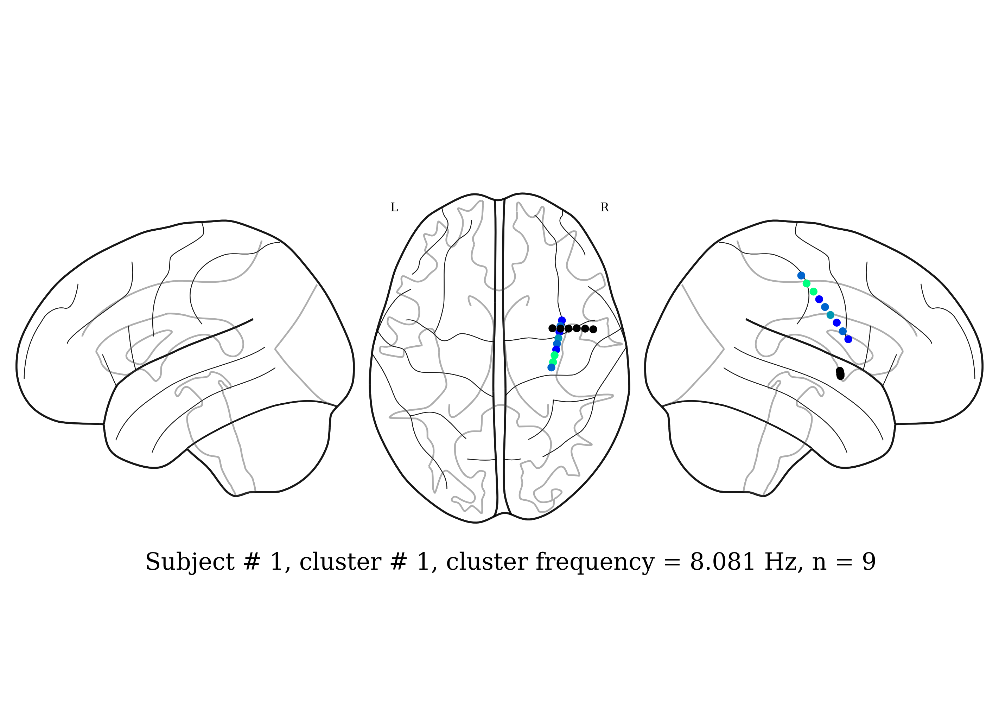

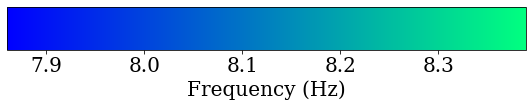

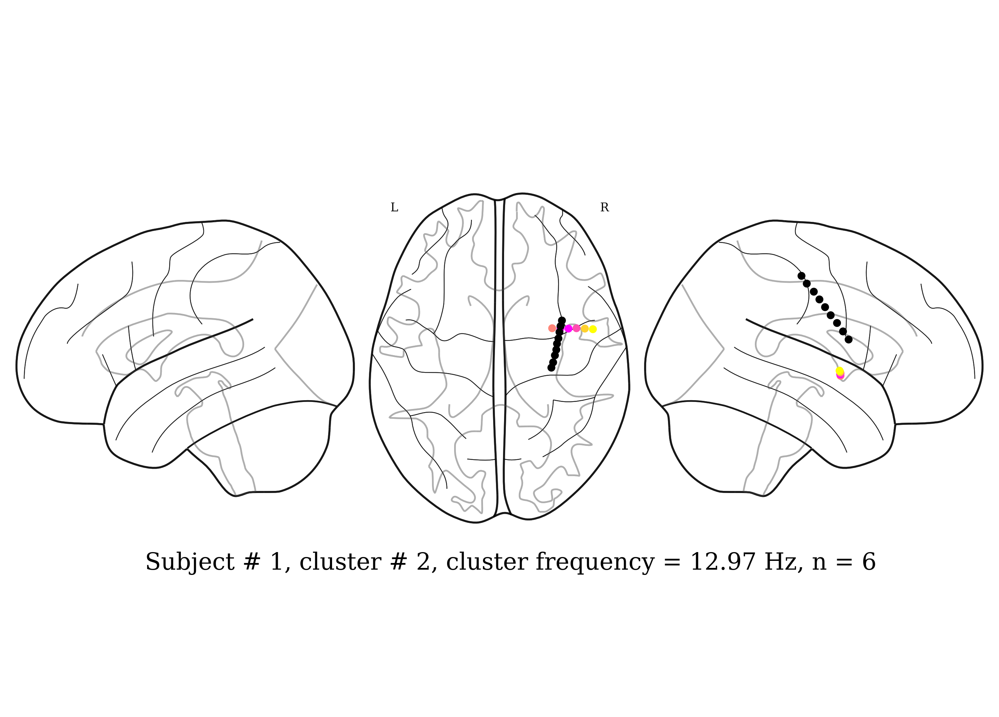

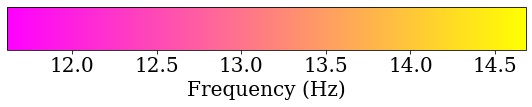

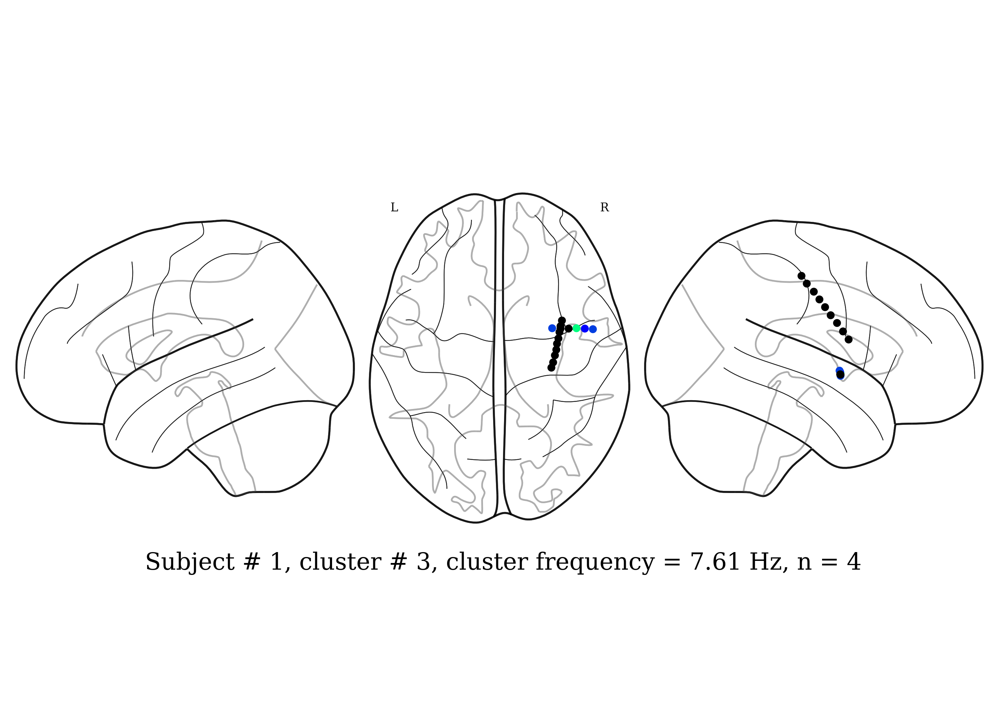

...

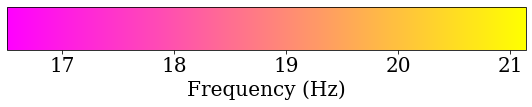

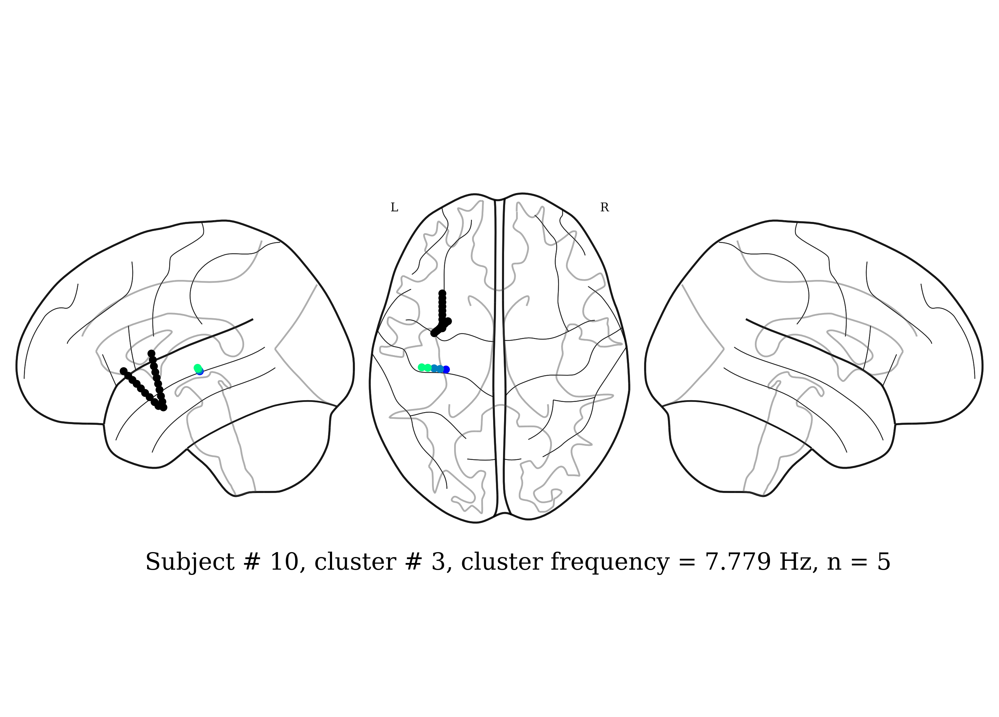

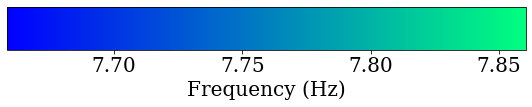

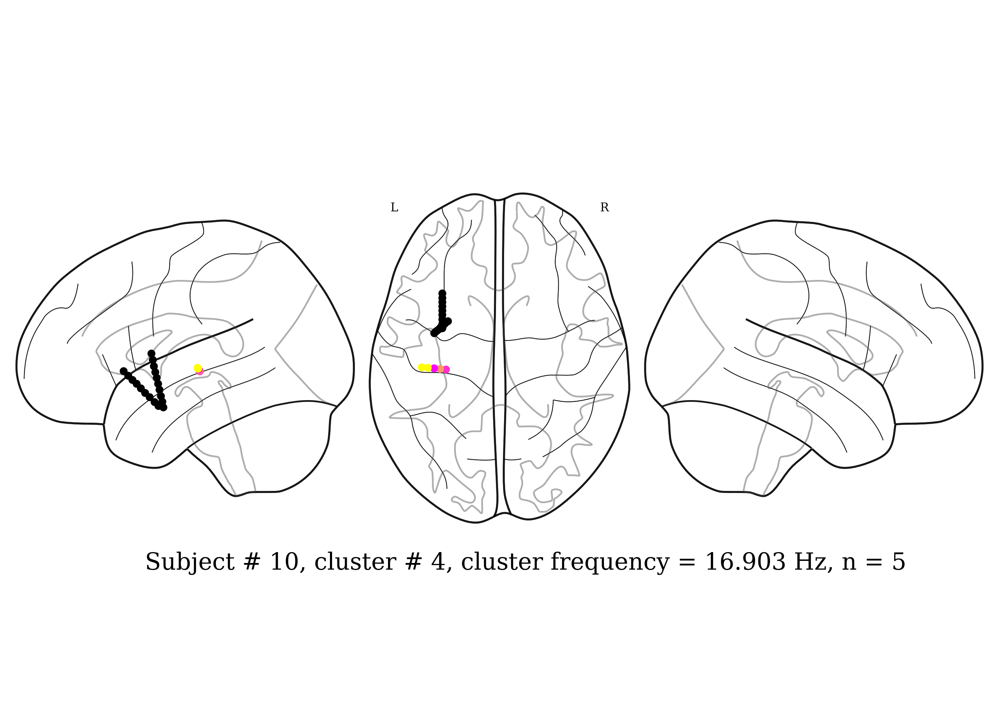

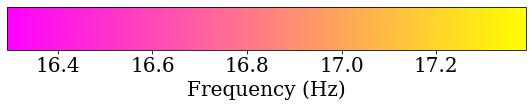

In [5]:
#Plot clusters
%matplotlib agg
Results_Dir = '/home1/anup.das/Results/baylor_frequency_images/'

for i_subj in range(0, len(insula_data_all.CAR_insula.data), 1):
    
    if not i_subj==3:
    
        Coord = insula_data_all.CAR_insula.coordinates[i_subj]
        xyz = Coord
        with open('/home1/anup.das/Results/baylor_files/cluster/res5min_subj_' + str(i_subj) + '.pkl', 'rb') as f:
            res = pickle.load(f)

        for i_cluster in range(0, np.shape(res['clusters'])[1], 1):

            curr_clus_str = 'cluster' + str(i_cluster+1)
            curr_clus = res['clusters'][curr_clus_str]
            curr_clus = np.asarray(curr_clus)
            clus_color = curr_clus[~np.isnan(curr_clus)]
            xyz_color = xyz[~np.isnan(curr_clus), :]
            xyz_nocolor = xyz[np.isnan(curr_clus), :]
            
            cluser_frequency_for_plot = np.mean(clus_color)
            
            if cluser_frequency_for_plot > 12:

                fig = plt.figure(figsize=(14,10), dpi= 200)
                plt.rcParams.update({'font.size': 20})
                ColorMap = plt.get_cmap('spring')
                ni_plot.plot_connectome(np.eye(xyz_color.shape[0]), xyz_color,
                                    node_kwargs={'alpha': 1, 'edgecolors': None, 'cmap': ColorMap},
                                    node_size=50, node_color = clus_color, display_mode='lzr',
                                        figure=fig)
                ni_plot.plot_connectome(np.eye(xyz_nocolor.shape[0]), xyz_nocolor,
                                    node_kwargs={'alpha': 1, 'edgecolors': None},
                                    node_size=50, node_color = 'k', display_mode='lzr', figure=fig)

                #cluser_frequency_for_plot = np.mean(clus_color)
                plt.figtext(0.14, 0.2, 'Subject # ' + str(i_subj + 1) + ', ' + 'cluster # ' + str(i_cluster + 1) + ', cluster frequency = ' + str(RAM_helpers_New.truncate(cluser_frequency_for_plot, 3)) + ' Hz, n = ' + str(clus_color.size), fontsize = 24)
                plt.savefig(Results_Dir + 'Brain.png', dpi=300, bbox_inches='tight')

                a = np.array([[np.min(clus_color), np.max(clus_color)]])
                pyl.figure(figsize=(9, 1.5))
                img = pyl.imshow(a, cmap="spring")
                pyl.gca().set_visible(False)
                cax = pyl.axes([0.1, 0.2, 0.8, 0.4])
                cbar = pyl.colorbar(orientation="horizontal", cax=cax)
                cbar.ax.tick_params(labelsize=20)
                cbar.set_label(label = 'Frequency (Hz)', fontsize = 20)

                plt.savefig(Results_Dir + 'Colorbar.png', dpi=300, bbox_inches='tight')

                im1 = Image.open(Results_Dir + 'Brain.png')
                im2 = Image.open(Results_Dir + 'Colorbar.png')
                Combined = im1.copy()
                Combined.paste(im2, (950, 50))
                Combined.save(Results_Dir + 'subj5min_diff_color_' + str(i_subj + 1) + '_cluster_' + str(i_cluster + 1) + '.bmp', quality=300)

                os.remove(Results_Dir + 'Brain.png') 
                os.remove(Results_Dir + 'Colorbar.png') 
                
            else:
                
                fig = plt.figure(figsize=(14,10), dpi= 200)
                plt.rcParams.update({'font.size': 20})
                ColorMap = plt.get_cmap('winter')
                ni_plot.plot_connectome(np.eye(xyz_color.shape[0]), xyz_color,
                                    node_kwargs={'alpha': 1, 'edgecolors': None, 'cmap': ColorMap},
                                    node_size=50, node_color = clus_color, display_mode='lzr',
                                        figure=fig)
                ni_plot.plot_connectome(np.eye(xyz_nocolor.shape[0]), xyz_nocolor,
                                    node_kwargs={'alpha': 1, 'edgecolors': None},
                                    node_size=50, node_color = 'k', display_mode='lzr', figure=fig)

                #cluser_frequency_for_plot = np.mean(clus_color)
                plt.figtext(0.14, 0.2, 'Subject # ' + str(i_subj + 1) + ', ' + 'cluster # ' + str(i_cluster + 1) + ', cluster frequency = ' + str(RAM_helpers_New.truncate(cluser_frequency_for_plot, 3)) + ' Hz, n = ' + str(clus_color.size), fontsize = 24)
                plt.savefig(Results_Dir + 'Brain.png', dpi=300, bbox_inches='tight')

                a = np.array([[np.min(clus_color), np.max(clus_color)]])
                pyl.figure(figsize=(9, 1.5))
                img = pyl.imshow(a, cmap="winter")
                pyl.gca().set_visible(False)
                cax = pyl.axes([0.1, 0.2, 0.8, 0.4])
                cbar = pyl.colorbar(orientation="horizontal", cax=cax)
                cbar.ax.tick_params(labelsize=20)
                cbar.set_label(label = 'Frequency (Hz)', fontsize = 20)

                plt.savefig(Results_Dir + 'Colorbar.png', dpi=300, bbox_inches='tight')

                im1 = Image.open(Results_Dir + 'Brain.png')
                im2 = Image.open(Results_Dir + 'Colorbar.png')
                Combined = im1.copy()
                Combined.paste(im2, (950, 50))
                Combined.save(Results_Dir + 'subj5min_diff_color_' + str(i_subj + 1) + '_cluster_' + str(i_cluster + 1) + '.bmp', quality=300)

                os.remove(Results_Dir + 'Brain.png') 
                os.remove(Results_Dir + 'Colorbar.png') 

In [ ]:
#calculate traveling waves in small data epochs to avoid memory problem
fs = 2000.
nyq = 0.5 * fs
N_Minutes = 5
N_Samples = int(N_Minutes*60*fs)
epoch_size = 20000
n_epochs = int(N_Samples/epoch_size)

thetas = np.radians(np.arange(0, 356, 5))
rs = np.radians(np.arange(0, 32.5, .3)) #32.5 approximately corresponds to 5.53 mm nyquist
theta_r = np.stack([(x, y) for x in thetas for y in rs])
params = np.stack([theta_r[:, 1] * np.cos(theta_r[:, 0]), theta_r[:, 1] * np.sin(theta_r[:, 0])], -1)
f = par_funcs.circ_lin_regress

for i_subj in range(0, len(insula_data_all.CAR_insula.data), 1):
    
    if not i_subj==3:
        
        Data = insula_data_all.CAR_insula.data[i_subj][:, 0:N_Samples]
        Coord = insula_data_all.CAR_insula.coordinates[i_subj]
        
        with open('/home1/anup.das/Results/baylor_files/cluster/res5min_subj_' + str(i_subj) + '.pkl', 'rb') as ff:
            res = pickle.load(ff)
        
        #Do filtering stuff on the whole data
        i=1
        phase_global = {}
        power_global = {}
        eeg_global = {}
        while 'cluster{}'.format(i) in res['clusters'].columns:
            eeg = []
            phase = []
            power = []
            cluster='cluster{}'.format(i)
            for j in range(len(res['clusters'])):
                freq=res['clusters'][cluster][j]
                if ~np.isnan(freq):
                    feeg = Data[j]
                    low = freq *.85 / nyq
                    high = freq/.85 / nyq
                    sos = butter(3, [low, high], analog=False, btype='band', output='sos')
                    feeg = sosfiltfilt(sos, feeg)
                    phase.append(np.angle(hilbert(feeg, N=feeg.shape[-1], axis=-1)))
                    power.append(np.abs(hilbert(feeg, N=feeg.shape[-1], axis=-1)))
                    eeg.append(feeg)

            phase_global[cluster] = phase
            power_global[cluster] = power
            eeg_global[cluster] = eeg
            i+=1


        for i_epoch in range(0, n_epochs, 1):
            i=1
            print('Traveling wave analysis')
            while 'cluster{}'.format(i) in res['clusters'].columns:
                res_temp={}
                clusterphase=[]
                clusterpower=[]
                clustereeg=[]
                cluster='cluster{}'.format(i)
                count = 0
                for j in range(len(res['clusters'])):
                    freq=res['clusters'][cluster][j]
                    if ~np.isnan(freq):
                        clusterphase.append(phase_global[cluster][count][int(i_epoch*epoch_size):int(i_epoch*epoch_size + epoch_size)])
                        clusterpower.append(power_global[cluster][count][int(i_epoch*epoch_size):int(i_epoch*epoch_size + epoch_size)])
                        clustereeg.append(eeg_global[cluster][count][int(i_epoch*epoch_size):int(i_epoch*epoch_size + epoch_size)]) 
                        count += 1
                res_temp['power']=np.stack(clusterpower)[:,:].astype('float32') 
                res_temp['phase']=np.stack(clusterphase)[:,:].astype('float32') 
                res_temp['eeg']=np.stack(clustereeg)[:,:].astype('float32') 
                xyz=Coord[~np.isnan(res['clusters'][cluster])]
                xyz -= np.mean(xyz, axis=0)
                pca = PCA(n_components=3)
                elec_dists = squareform(pdist(xyz))
                near_adj_matr = (elec_dists < 20.)
                local_angle={}
                local_sf={}
                local_rs={}
                local_off={}
                for j in tqdm(range(0,len(xyz))):
                    if sum(near_adj_matr[j])>3:
                        loc_tmp = xyz[near_adj_matr[j],:]
                        loc_tmp -= np.mean(loc_tmp, axis=0)
                        norm_coords = pca.fit_transform(loc_tmp)[:, :2]
                        num_iters = int(res_temp['phase'][near_adj_matr[j]].T.shape[0])
                        data_as_list = zip(np.expand_dims(res_temp['phase'][near_adj_matr[j]].T, 1),np.array([norm_coords]*num_iters), [theta_r]*num_iters, [params]*num_iters)
                        res_as_list = Parallel(n_jobs=40, verbose=0)(delayed(f)(x[0], x[1], x[2], x[3]) for x in data_as_list)
                        local_angle[j]=np.stack([x[0] for x in res_as_list], axis=0).astype('float32') 
                        local_sf[j]=np.stack([x[1] for x in res_as_list], axis=0).astype('float32') 
                        local_rs[j]=np.stack([x[2] for x in res_as_list], axis=0).astype('float32')
                        local_off[j]=np.stack([x[3] for x in res_as_list], axis=0).astype('float32')  
                res_temp['direction'] = local_angle 
                res_temp['spatial_freuency']= local_sf
                res_temp['rs']= local_rs
                res_temp['offs']= local_off
                if cluster not in res:
                    res[cluster]={}
                res[cluster]['RESTING_STATE']=res_temp
                joblib.dump(res, '/home1/anup.das/Results/baylor_files/tw/subj5min_' + str(i_subj) + '_' + cluster + '_epoch' + str(i_epoch) + '.sav')
                i+=1

  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/9 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/11 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/39 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/10 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


  0%|          | 0/16 [00:00<?, ?it/s]

Traveling wave analysis


 81%|████████▏ | 13/16 [01:49<00:25,  8.36s/it]